# **Notebook pour la confirmation des dates de l'épisode 3 (2020/08/04-2020/08/07) avec une CAH :**

In [1]:
import os

In [2]:
os.getcwd()

'E:\\PROPEX'

In [3]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import contextily as cx
import geoplot
import geoplot.crs as gcrs
# librairie pour faire l'union entre toutes les zones d'un meme épisode :
from shapely.ops import unary_union
from scipy.cluster.hierarchy import dendrogram, linkage
from datetime import datetime
import time
from scipy.cluster.hierarchy import fcluster
import numpy as np
import seaborn as sns

#### Zones géographiques :

**On charge directement les zones selectionnées dans le notebook qui traite l'épisode 2.**

In [4]:
episodes_poly = gpd.read_file("reduced_clusters_episodes.gpkg")
episodes_poly

,episode,cluster,surface,geometry
0,2.0,1,4.029478e+09,"POLYGON ((298454.524 6698102.650, 239414.604 6..."
1,3.0,1,7.029132e+09,"POLYGON ((332691.172 6611234.696, 307142.421 6..."
2,3.0,2,5.640539e+09,"POLYGON ((254420.261 6743045.788, 155335.694 6..."
3,4.0,4,3.294528e+09,"POLYGON ((221321.615 6754441.504, 155335.694 6..."
4,4.0,5,5.372526e+09,"POLYGON ((494912.457 6873022.163, 419512.358 6..."
5,5.0,4,5.623985e+09,"POLYGON ((777352.759 6294785.790, 755479.875 6..."
6,5.0,5,1.960760e+09,"POLYGON ((155335.694 6769685.939, 138446.487 6..."
7,6.0,1,1.435426e+09,"POLYGON ((346927.916 6601918.087, 332691.172 6..."


In [5]:
episodes_poly.crs

<Projected CRS: EPSG:2154>
Name: RGF93 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

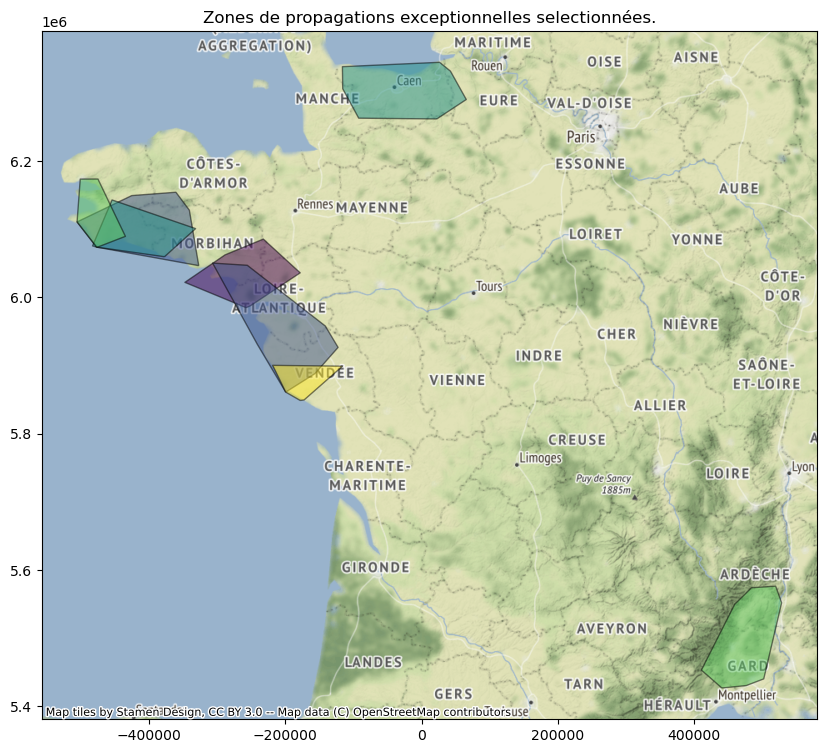

In [6]:
ax = episodes_poly.to_crs(3857).plot(figsize=(10, 10), alpha=0.5, edgecolor='k', column="episode")
plt.title("Zones de propagations exceptionnelles selectionnées.")
cx.add_basemap(ax, url=cx.providers.OpenStreetMap.France())
plt.show()

In [7]:
# aggréger par épisode
episodes_grouped = episodes_poly.dissolve("episode")
episodes_grouped

,geometry,cluster,surface
episode,,,
2.0,"POLYGON ((298454.524 6698102.650, 239414.604 6...",1,4.029478e+09
3.0,"MULTIPOLYGON (((332691.172 6611234.696, 307142...",1,7.029132e+09
4.0,"MULTIPOLYGON (((221321.615 6754441.504, 155335...",4,3.294528e+09
5.0,"MULTIPOLYGON (((777352.759 6294785.790, 755479...",4,5.623985e+09
6.0,"POLYGON ((346927.916 6601918.087, 332691.172 6...",1,1.435426e+09


**Les niveaux dans lesquels les propagations exceptionnelles surviennent (on monte jusqu'à 16100 mettres) :**

In [8]:
altitudes = {"1000 mb": 100, "975 mb": 300, "950 mb": 500, "925 mb": 750, "900 mb": 1000, "850 mb": 1450, "800 mb": 1950, "750 mb": 2450,
"700 mb": 3000, "650 mb": 3550, "600 mb": 4200, "550 mb": 4850, "500 mb": 5550, "450 mb": 6350, "400 mb": 7200, "350 mb": 8100, "300 mb": 9100,
"250 mb": 10350, "200 mb": 11800, "150 mb": 13650, "100 mb": 16100}

In [9]:
# écriture des niveaux dans un csv pour une manipulation sous R
#with open("levels.csv", "w+", encoding="utf-8") as fo:
#    fo.write("levels\n")
#    fo.write("\n".join(altitudes.keys()))

**Remarque: Charger et traiter tous les 8 épisodes dans un meme notebook est très gourmand et peut faire planter le kernel. Nous traitons donc chaque épisode dans un notebook différent.**

In [10]:
num_ep = 4

In [11]:
path = "LISTES_EPISODES/LISTE1/"

whole_df = None
for episode in [f"EP_{num_ep}"]:
    df = pd.read_csv(path+episode+"/before.csv")
    df = df[df.levels.isin(altitudes)]
    # transformation du format long vers large
    df_wide = pd.pivot(df, index=["forecast.date", "levels", "lon", "lat"], columns="variables", values="value")
    df_wide.reset_index(inplace=True)
    df_wide["episode"] = [episode for _ in range(df_wide.shape[0])]
    if whole_df is None:
        whole_df = df_wide
    else:
        whole_df = pd.concat([whole_df, df_wide])

In [12]:
whole_df_before = whole_df

In [13]:
path = "LISTES_EPISODES/LISTE1/"

whole_df = None
for episode in [f"EP_{num_ep}"]:
    df = pd.read_csv(path+episode+"/during.csv")
    df = df[df.levels.isin(altitudes)]
    df_wide = pd.pivot(df, index=["forecast.date", "levels", "lon", "lat"], columns="variables", values="value")
    df_wide.reset_index(inplace=True)
    df_wide["episode"] = [episode for _ in range(df_wide.shape[0])]
    if whole_df is None:
        whole_df = df_wide
    else:
        whole_df = pd.concat([whole_df, df_wide])

In [14]:
whole_df_during = whole_df

In [15]:
whole_df_before["period"] = [0 for _ in range(whole_df_before.shape[0])]
whole_df_during["period"] = [1 for _ in range(whole_df_during.shape[0])]

In [16]:
whole_df = pd.concat([whole_df_before, whole_df_during])

In [17]:
whole_df.head()

variables,forecast.date,levels,lon,lat,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,episode,period
0,2020-07-31 00:00:00,100 mb,-11.5,38.0,0.000064,16764.0,13.3,207.532,8.37625,6.54533,0.023176,EP_4,0
1,2020-07-31 00:00:00,100 mb,-11.5,38.5,0.000085,16758.9,12.8,207.632,8.88625,6.86533,0.001776,EP_4,0
2,2020-07-31 00:00:00,100 mb,-11.5,39.0,0.000076,16751.8,11.7,208.232,8.88625,7.59533,0.049876,EP_4,0
3,2020-07-31 00:00:00,100 mb,-11.5,39.5,0.000077,16746.7,10.9,208.832,9.06625,8.74533,0.057676,EP_4,0
4,2020-07-31 00:00:00,100 mb,-11.5,40.0,0.000094,16742.9,9.7,209.532,9.78625,9.44533,0.005976,EP_4,0


In [18]:
whole_df_gpd = gpd.GeoDataFrame(
    whole_df, geometry=gpd.points_from_xy(np.array(whole_df.lon), np.array(whole_df.lat))
)

E:\anaconda\envs\geo_env\lib\site-packages\geopandas\array.py:275: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  return GeometryArray(vectorized.points_from_xy(x, y, z), crs=crs)


In [19]:
# les données sont sur la projection EPSG:4326, une transformation vers le système de projection de la France métropolitaine sera faite par la suite
whole_df_gpd = whole_df_gpd.set_crs('epsg:4326')

On travail avec le système de projection officiel de la France métropolitaine tel que défini par l'IGN :

In [20]:
whole_df_gpd = whole_df_gpd.to_crs(epsg=2154)
whole_df_gpd.crs

<Projected CRS: EPSG:2154>
Name: RGF93 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [21]:
# récupérer uniquement les numéros d'épisodes (sans le EP_)
whole_df_gpd.episode = list(map(lambda x: int(x[-1]), whole_df_gpd.episode))

In [22]:
l = gpd.sjoin(whole_df_gpd[whole_df_gpd.episode == num_ep], episodes_grouped[episodes_grouped.index == num_ep], how='inner', op='within')
df_propa = gpd.GeoDataFrame(l)
df_propa.shape

(5376, 17)

In [23]:
df_propa.head()

,forecast.date,levels,lon,lat,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,episode,period,geometry,index_right,cluster,surface
560,2020-07-31 00:00:00,100 mb,-4.0,48.0,0.000089,16692.3000,3.5,214.532,10.79630,7.23533,0.022276,4,0,POINT (178626.397 6789748.646),4.0,4,3.294528e+09
596,2020-07-31 00:00:00,100 mb,-3.5,48.0,0.000076,16694.4000,3.7,214.232,10.79630,6.00533,0.033576,4,0,POINT (215779.966 6786564.865),4.0,4,3.294528e+09
814,2020-07-31 00:00:00,100 mb,-0.5,49.0,0.000149,16696.8000,3.8,214.732,11.76620,4.04533,-0.075724,4,0,POINT (443982.575 6883461.598),4.0,4,3.294528e+09
850,2020-07-31 00:00:00,100 mb,0.0,49.0,0.000137,16697.0000,3.7,215.132,11.66630,3.78533,-0.055624,4,0,POINT (480537.426 6881956.194),4.0,4,3.294528e+09
2504,2020-07-31 00:00:00,1000 mb,-4.0,48.0,0.000130,93.2525,48.5,295.397,-1.05258,1.32020,-0.022419,4,0,POINT (178626.397 6789748.646),4.0,4,3.294528e+09


La variable représentant le temps est transformée en secondes afin d'etre exploitée en tant que variable numérique discrete dans le modèle :

In [24]:
df_propa['num_date'] = df_propa['forecast.date'].apply(lambda x: time.mktime(datetime.strptime(x, "%Y-%m-%d %H:%M:%S").timetuple()))

In [25]:
df_propa.head()

,forecast.date,levels,lon,lat,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,episode,period,geometry,index_right,cluster,surface,num_date
560,2020-07-31 00:00:00,100 mb,-4.0,48.0,0.000089,16692.3000,3.5,214.532,10.79630,7.23533,0.022276,4,0,POINT (178626.397 6789748.646),4.0,4,3.294528e+09,1.596146e+09
596,2020-07-31 00:00:00,100 mb,-3.5,48.0,0.000076,16694.4000,3.7,214.232,10.79630,6.00533,0.033576,4,0,POINT (215779.966 6786564.865),4.0,4,3.294528e+09,1.596146e+09
814,2020-07-31 00:00:00,100 mb,-0.5,49.0,0.000149,16696.8000,3.8,214.732,11.76620,4.04533,-0.075724,4,0,POINT (443982.575 6883461.598),4.0,4,3.294528e+09,1.596146e+09
850,2020-07-31 00:00:00,100 mb,0.0,49.0,0.000137,16697.0000,3.7,215.132,11.66630,3.78533,-0.055624,4,0,POINT (480537.426 6881956.194),4.0,4,3.294528e+09,1.596146e+09
2504,2020-07-31 00:00:00,1000 mb,-4.0,48.0,0.000130,93.2525,48.5,295.397,-1.05258,1.32020,-0.022419,4,0,POINT (178626.397 6789748.646),4.0,4,3.294528e+09,1.596146e+09


In [26]:
ep = df_propa[df_propa['episode'] == num_ep]
ep.shape

(5376, 18)

In [27]:
X = ep[['lon', 'lat', 'ABSV', 'HGT', 'RH', 'TMP', 'UGRD', 'VGRD', 'VVEL', 'num_date']]

In [28]:
X.shape

(5376, 10)

(5375, 4)


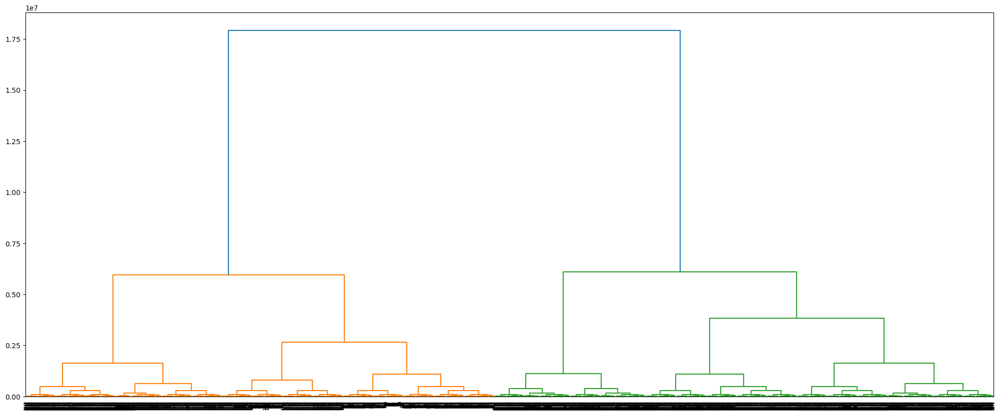

In [29]:
clustering = linkage(X, 'ward')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(clustering, get_leaves=True)
print(clustering.shape)

Il parait naturel ici de couper l'arbre de sorte à avoir 3 clusters de part la distance les séparant. Il est aussi raisonable d'en extraire 2 mais pour notre cas d'étude on cherche à trouver 3 groupes (période normale, période de transition et période de propagation).

**Pour s'assurer du nombre de cluster on va quand meme utiliser un critère de `distortion` afin de déduire le nombre de clusters proposé par la CAH.**

`distortion` : moyenne de la somme des distances entre les centres au carré.

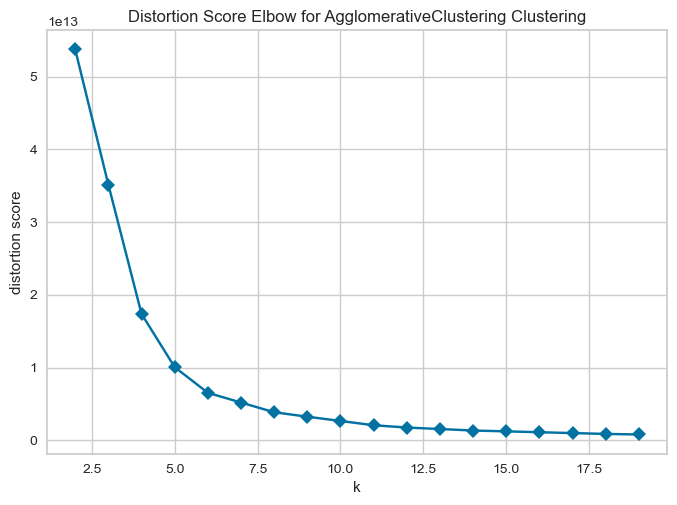

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [32]:
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
model = AgglomerativeClustering()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2, 20), timings=False, metric='distortion', locate_elbow=False)
# Fit data to visualizer
visualizer.fit(X)
# Finalize and render figure
visualizer.show()

D'après le graphique, prendre un nombre de clusters allant de 3 à 7 parait raisonable, on va donc rester avec 3.

In [33]:
# une coupe qui permet d'obtenir 3 clusters
max_d = 0.75*1e7
clusters = fcluster(clustering, max_d, criterion='distance')
np.unique(clusters)

array([1, 2], dtype=int32)

In [34]:
X['pred'] = clusters
X.head()

C:\Users\TIGHIDET\AppData\Local\Temp\ipykernel_9136\1911932628.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['pred'] = clusters


,lon,lat,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,num_date,pred
560,-4.0,48.0,0.000089,16692.3000,3.5,214.532,10.79630,7.23533,0.022276,1.596146e+09,1
596,-3.5,48.0,0.000076,16694.4000,3.7,214.232,10.79630,6.00533,0.033576,1.596146e+09,1
814,-0.5,49.0,0.000149,16696.8000,3.8,214.732,11.76620,4.04533,-0.075724,1.596146e+09,1
850,0.0,49.0,0.000137,16697.0000,3.7,215.132,11.66630,3.78533,-0.055624,1.596146e+09,1
2504,-4.0,48.0,0.000130,93.2525,48.5,295.397,-1.05258,1.32020,-0.022419,1.596146e+09,1


In [35]:
ep['pred'] = clusters

In [39]:
d_colors = {1: u'green', 2: u'red', 3: u'orange'}
color_maps = [d_colors[pred] for pred in ep['pred']]

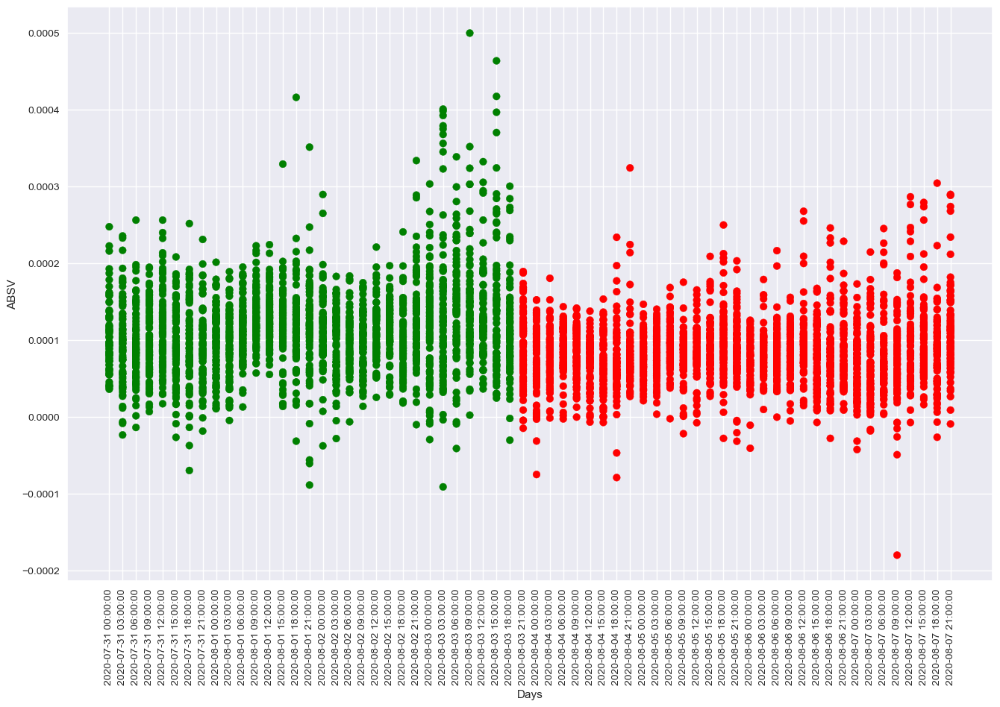

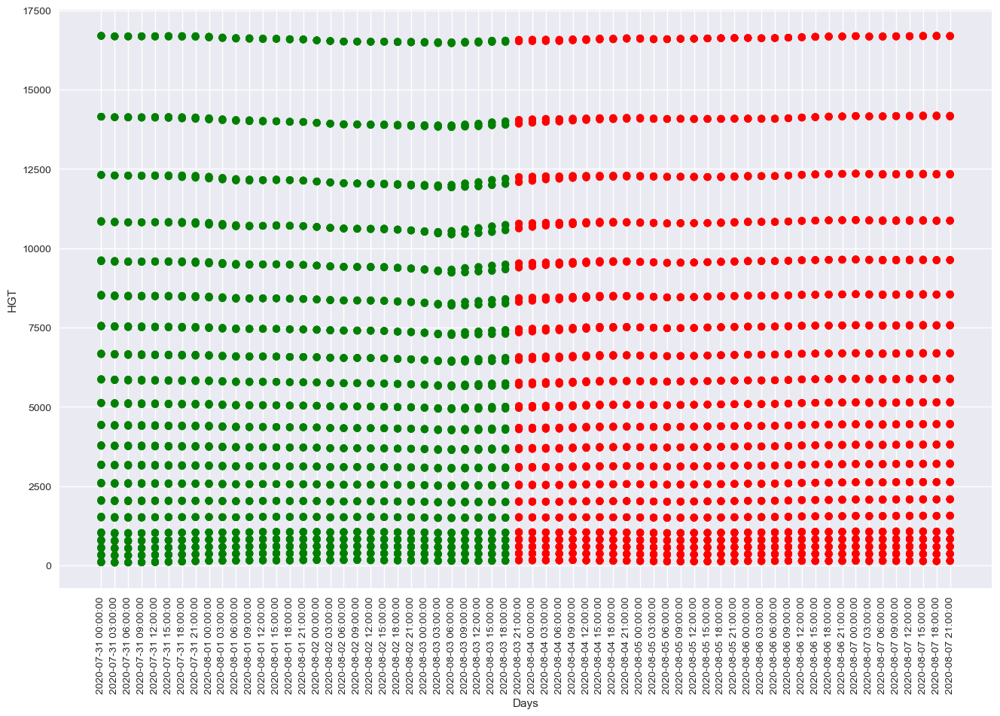

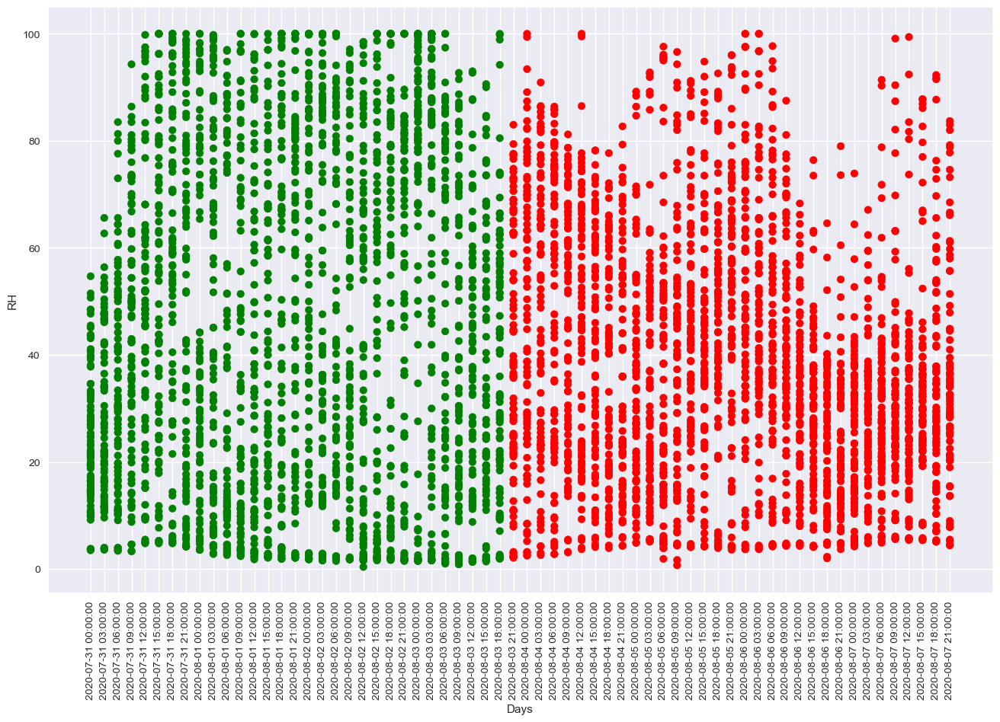

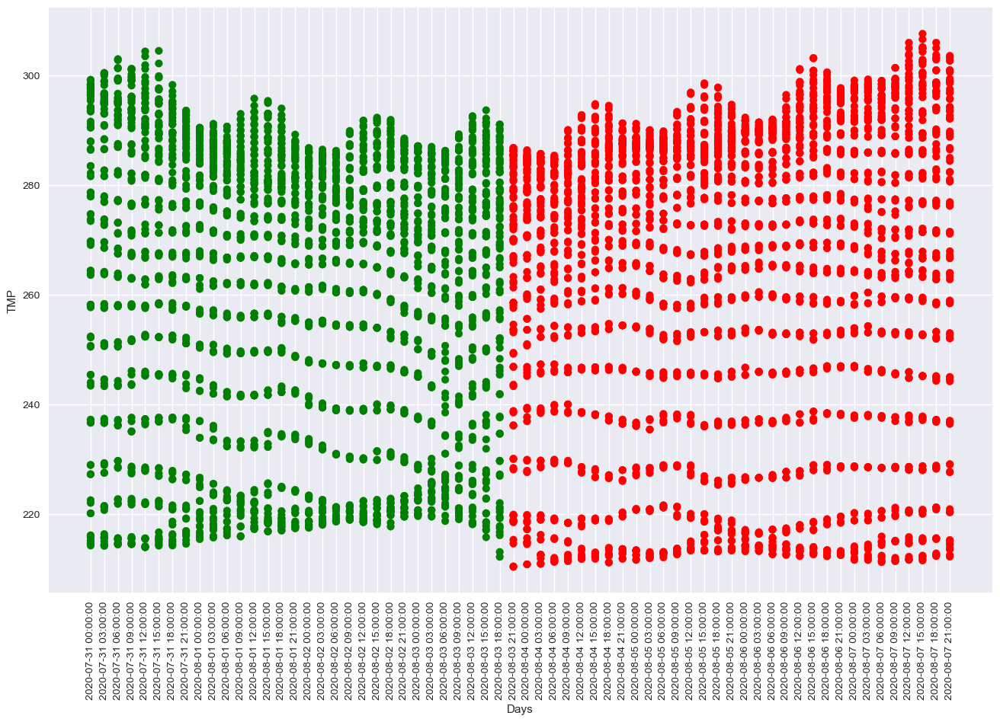

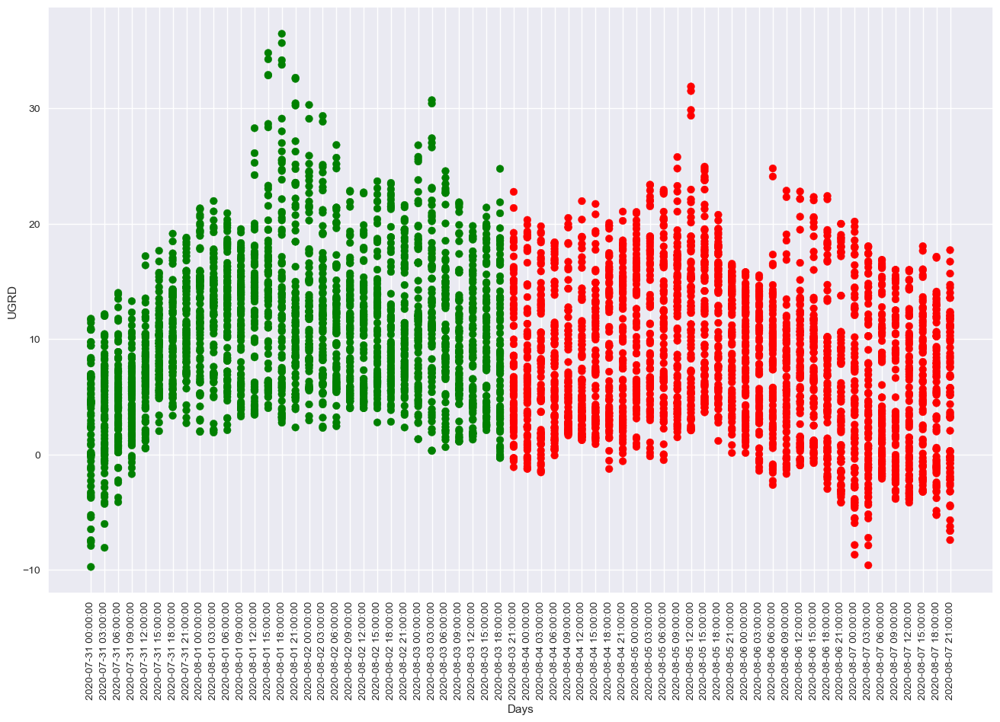

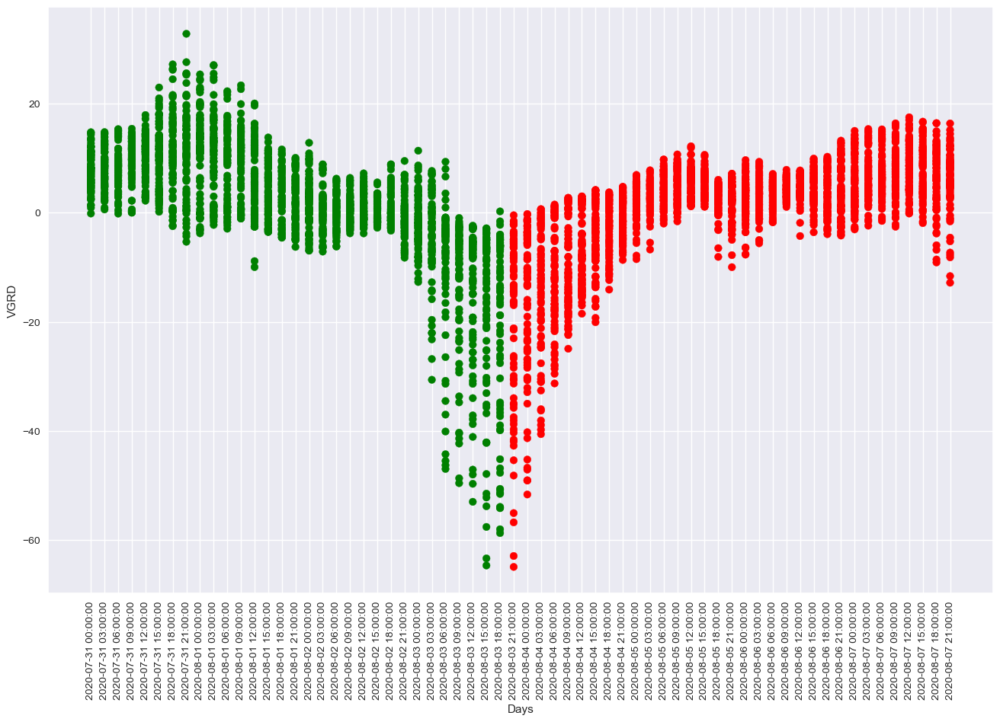

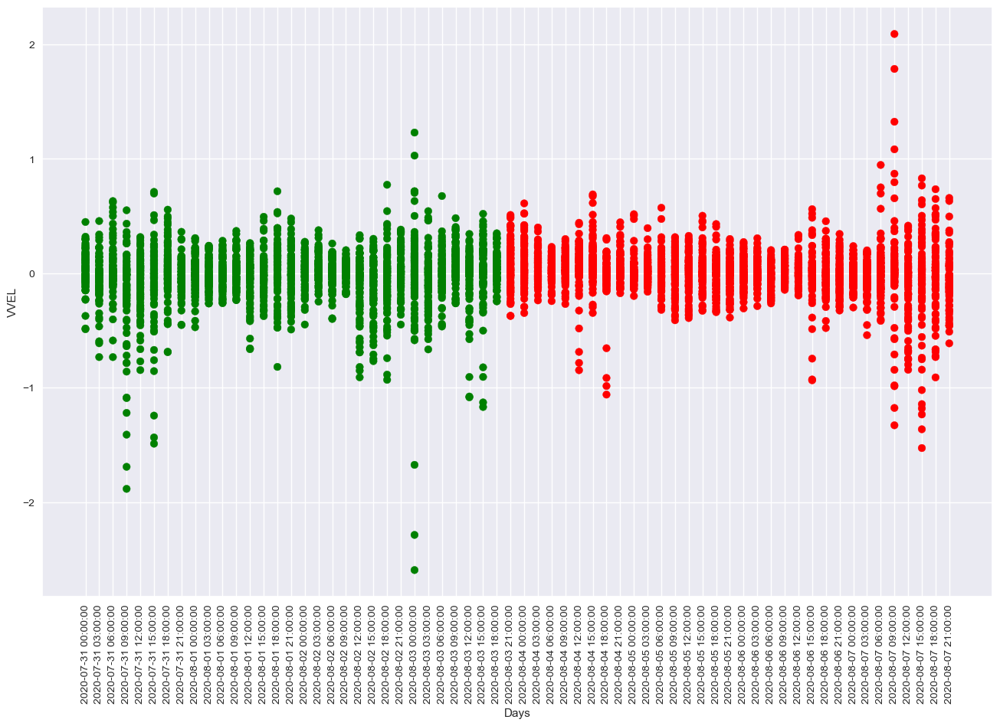

In [40]:
with sns.axes_style("darkgrid"):
    for var_name in ["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"]:
        plt.figure(figsize=(16,10))
        plt.scatter(x=ep['forecast.date'], y=ep[var_name], c=color_maps)
        plt.xlabel('Days')
        plt.ylabel(var_name)
        plt.xticks(rotation = 90)
        plt.show()

**Ce qui est interessant à voir est que le modèle regroupe bien tous les points de chaque journée dans le meme cluster (i.e pour une meme journée il ne fait pas la différence entre deux zones différents).**

Période de propagations observée : 04/08/2020 --> 07/08/2020

Période normale/transition renvoyée par le modèle : début --> 03/08/2020 à 18h

In [41]:
# enregistrer les résultats pour utilisation dans le modèle prédictif
ep.to_csv(f"RESULTATS_CAH_confirmation/LISTE1/EP_{num_ep}.csv")

## Extract the most influential variables, if not possible study the variation and the correlations of the data:

**ANOVA Test:**

In [42]:
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest

In [43]:
ANOVA_res = SelectKBest(f_classif, k="all")
ANOVA_res.fit(
    X=ep[['lon', 'lat', 'ABSV', 'HGT', 'RH', 'TMP', 'UGRD', 'VGRD', 'VVEL', 'num_date']],
    y=ep[['pred']]
)

E:\anaconda\envs\geo_env\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SelectKBest(k='all')

In [44]:
pd.DataFrame({'Variables': ANOVA_res.feature_names_in_, 'ANOVA Score': ANOVA_res.scores_, 'P-value': ANOVA_res.pvalues_}).sort_values(by='ANOVA Score', ascending=False)

,Variables,ANOVA Score,P-value
9,num_date,16074.804930,0.000000e+00
2,ABSV,493.936451,9.180090e-105
6,UGRD,200.533368,1.009647e-44
4,RH,108.345672,3.908324e-25
8,VVEL,16.320485,5.422863e-05
5,TMP,10.239684,1.382504e-03
7,VGRD,8.723439,3.155062e-03
3,HGT,0.179992,6.713969e-01
0,lon,0.000000,1.000000e+00
1,lat,0.000000,1.000000e+00


ANOVA uses the F-value to determine whether the between group variability of means is larger than the within the group variability of the individual values

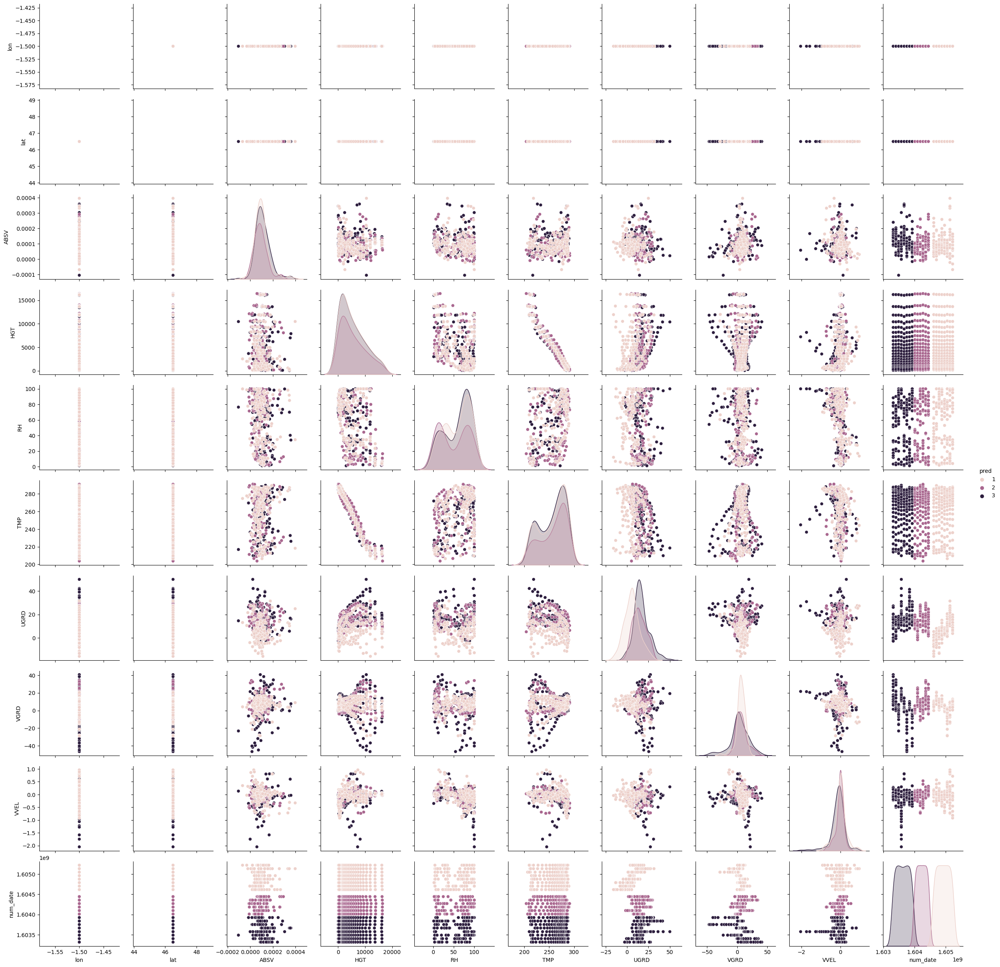

In [95]:
sns.pairplot(ep6[['lon', 'lat', 'ABSV', 'HGT', 'RH', 'TMP', 'UGRD', 'VGRD', 'VVEL', 'num_date', 'pred']], hue='pred')

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

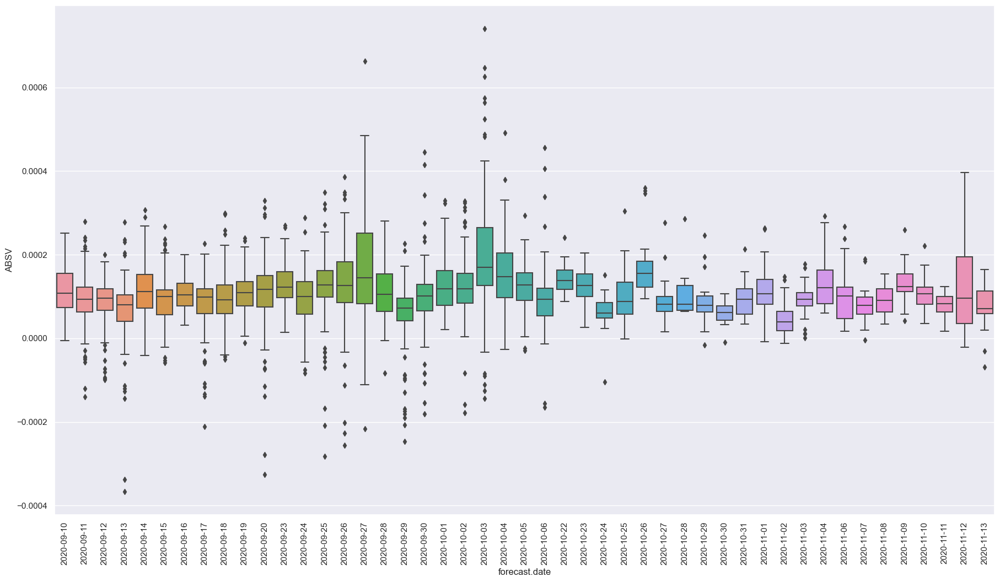

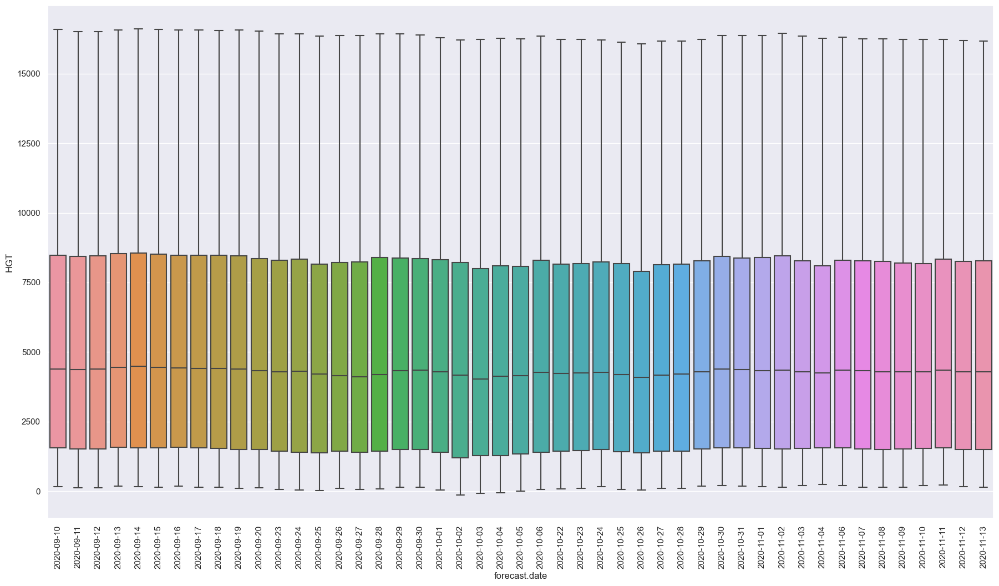

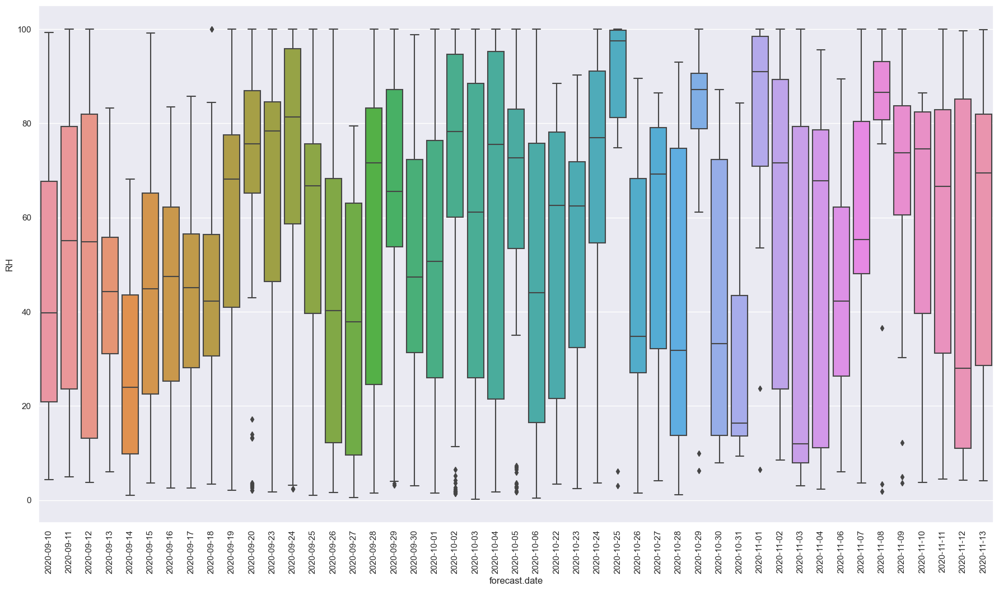

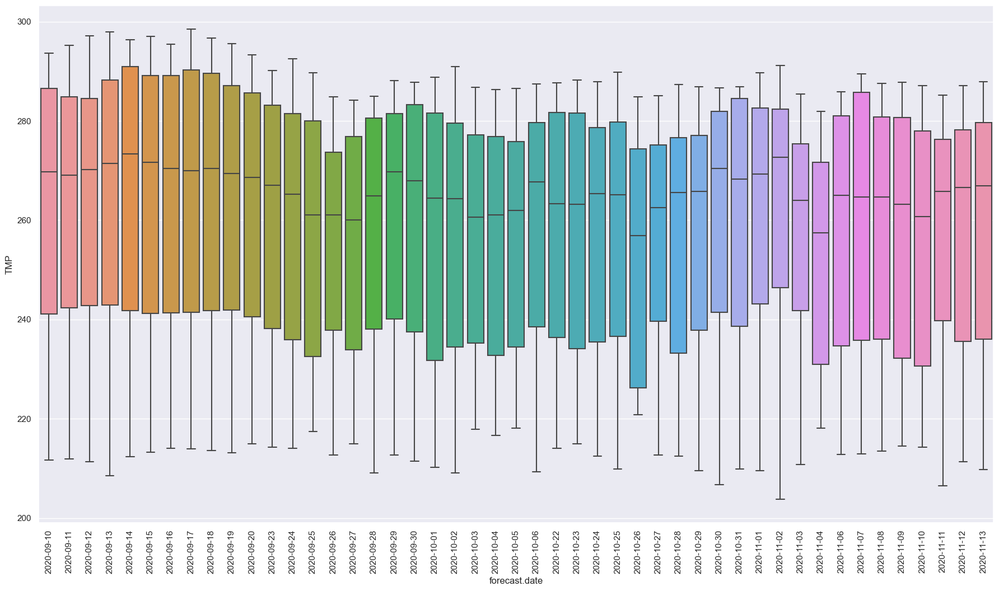

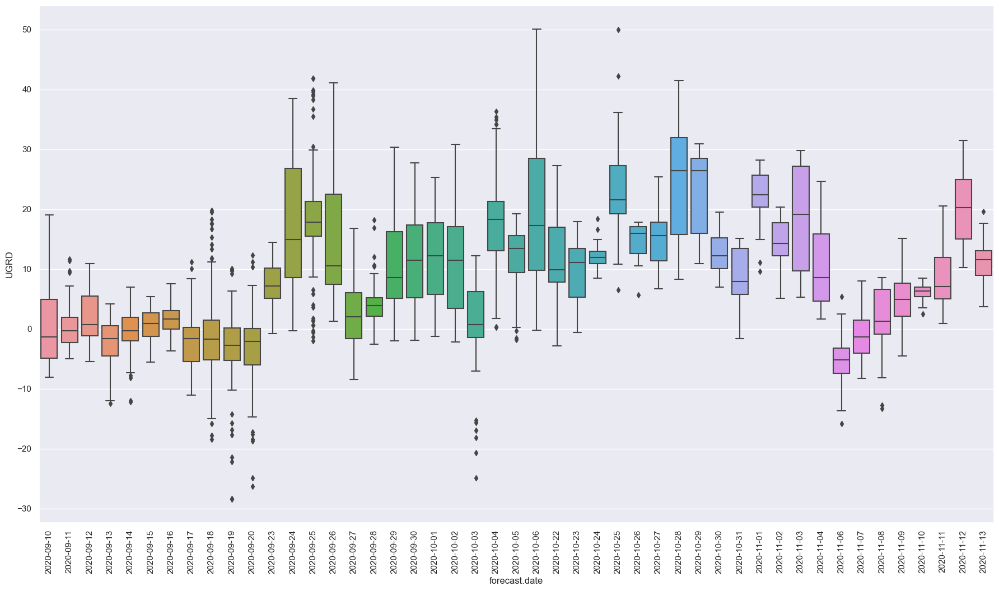

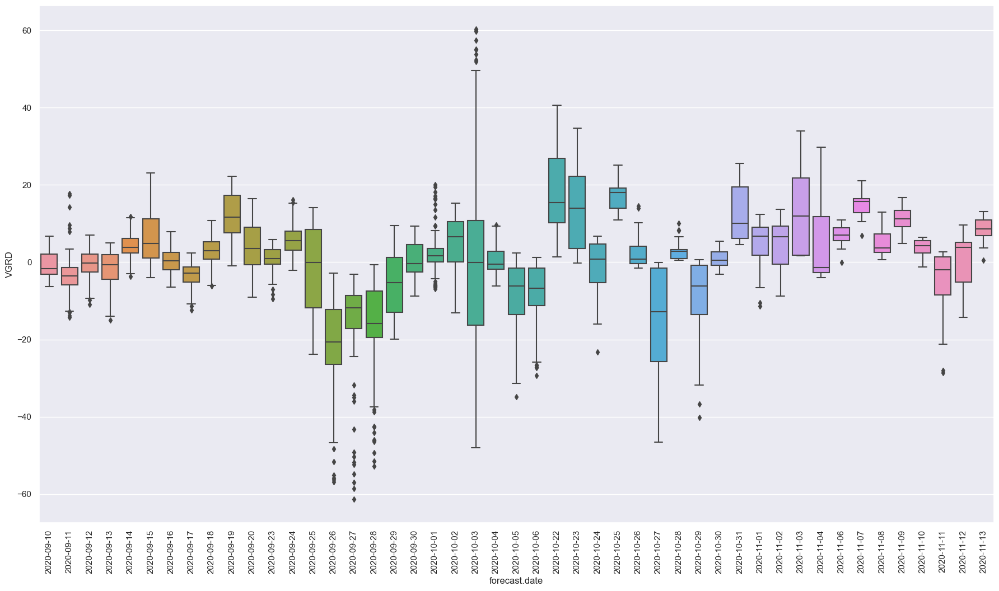

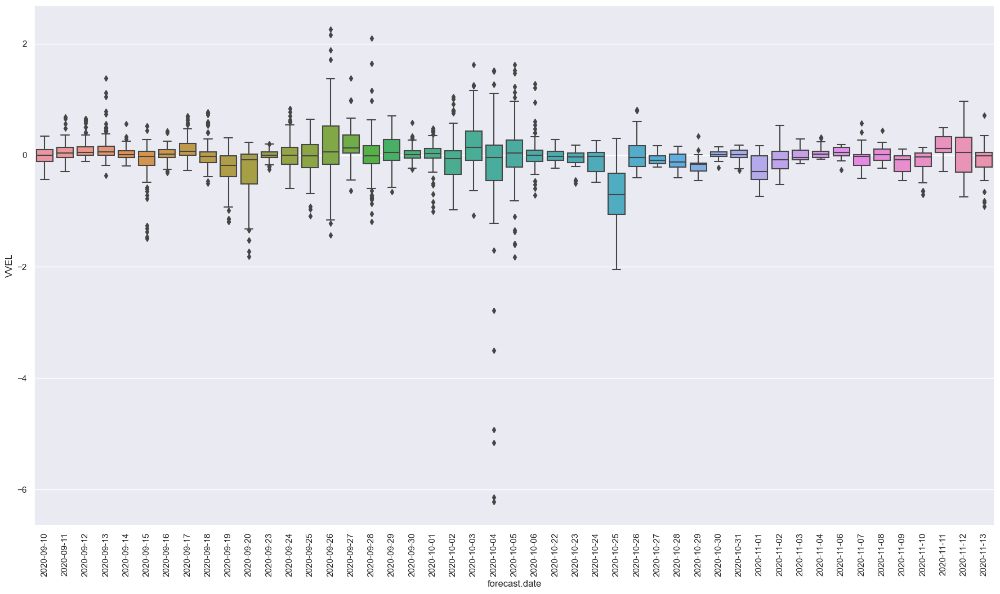

In [37]:
sns.set(rc={'figure.figsize':(12,10)})
for var_name in ["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"]:
    plt.figure(figsize=(22, 12))
    ax = sns.boxplot(y=df_propa[var_name], x=df_propa["forecast.date"])
    ax.tick_params(axis='x', rotation=90)
    plt.show()

### Utilisation de la médiane qui est moins sensible aux points extremes:

In [266]:
df_propa_avg = df_propa.groupby(["forecast.date"])["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"].median()

C:\Users\TIGHIDET\AppData\Local\Temp\ipykernel_6968\3819115358.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_propa_avg = df_propa.groupby(["forecast.date"])["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"].median()


In [267]:
df_propa_avg["forecast.date"] = df_propa_avg.index

In [268]:
df_propa_avg = df_propa_avg.reset_index(drop=True)

In [269]:
df_propa_avg["forecast.date"] = df_propa_avg["forecast.date"].astype(str)
df_propa["forecast.date"] = df_propa["forecast.date"].astype(str)

In [270]:
df_propa["forecast.date"].astype(str)

524       2020-09-10
560       2020-09-10
705       2020-09-10
740       2020-09-10
741       2020-09-10
             ...    
448288    2018-11-08
448289    2018-11-08
448290    2018-11-08
448323    2018-11-08
448324    2018-11-08
Name: forecast.date, Length: 109599, dtype: object

In [271]:
df_propa_avg = df_propa_avg.merge(df_propa[["forecast.date", "episode"]], how="left", left_on="forecast.date", right_on="forecast.date")

In [272]:
df_propa_avg.drop_duplicates(subset="forecast.date", keep="first", inplace=True)

In [273]:
df_propa_avg.head()

,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,forecast.date,episode
0,0.000133,4238.00,64.02325,265.178,1.444570,14.219800,0.007874,2018-10-11,8
2940,0.000092,4309.89,68.77810,268.652,13.705200,8.091095,-0.004934,2018-10-12,8
5880,0.000072,4399.85,57.05190,271.748,6.835875,7.491005,0.021802,2018-10-13,8
8820,0.000066,4313.24,64.58140,270.333,3.102670,10.374200,-0.027817,2018-10-14,8
11760,0.000092,4251.06,80.00000,267.795,-1.418365,10.401250,0.002631,2018-10-15,8


In [274]:
colors = {5: "b", 6: "g", 7: "r", 8: "k"}

In [286]:
episodes_limits = pd.DataFrame({"episode": [5, 6, 7, 8], "debut": ["2020-09-20", "2020-11-05", "2020-11-21", "2018-10-22"], "fin": ["2020-09-22", "2020-11-06", "2020-11-23", "2018-10-28"]})
episodes_limits

,episode,debut,fin
0,5,2020-09-20,2020-09-22
1,6,2020-11-05,2020-11-06
2,7,2020-11-21,2020-11-23
3,8,2018-10-22,2018-10-28


In [276]:
episodes_limits.debut.astype(str)

0    2020-09-20
1    2020-11-05
2    2020-11-21
3    2018-10-22
Name: debut, dtype: object

In [277]:
df_propa_avg

,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,forecast.date,episode
0,0.000133,4238.000,64.02325,265.178,1.444570,14.219800,0.007874,2018-10-11,8
2940,0.000092,4309.890,68.77810,268.652,13.705200,8.091095,-0.004934,2018-10-12,8
5880,0.000072,4399.850,57.05190,271.748,6.835875,7.491005,0.021802,2018-10-13,8
8820,0.000066,4313.240,64.58140,270.333,3.102670,10.374200,-0.027817,2018-10-14,8
11760,0.000092,4251.060,80.00000,267.795,-1.418365,10.401250,0.002631,2018-10-15,8
...,...,...,...,...,...,...,...,...,...
105819,0.000108,4296.815,17.25000,263.100,-0.519484,-4.535990,0.084641,2020-11-30,7
106575,0.000078,4289.385,90.05000,262.589,7.851855,-11.428550,-0.051184,2020-12-01,7
107331,0.000125,4163.570,51.40000,257.550,-4.837360,-14.247000,-0.004369,2020-12-02,7
108087,0.000087,4161.215,82.20000,261.069,7.446325,-10.102300,0.004915,2020-12-03,7


In [300]:
episodes_limits = pd.DataFrame({"episode": [5, 6, 7, 8], "debut": ["2020-09-20", "2020-11-06", "2020-11-20", "2018-10-21"], "fin": ["2020-09-22", "2020-11-06", "2020-11-23", "2018-10-28"]})
episodes_limits

,episode,debut,fin
0,5,2020-09-20,2020-09-22
1,6,2020-11-06,2020-11-06
2,7,2020-11-20,2020-11-23
3,8,2018-10-21,2018-10-28


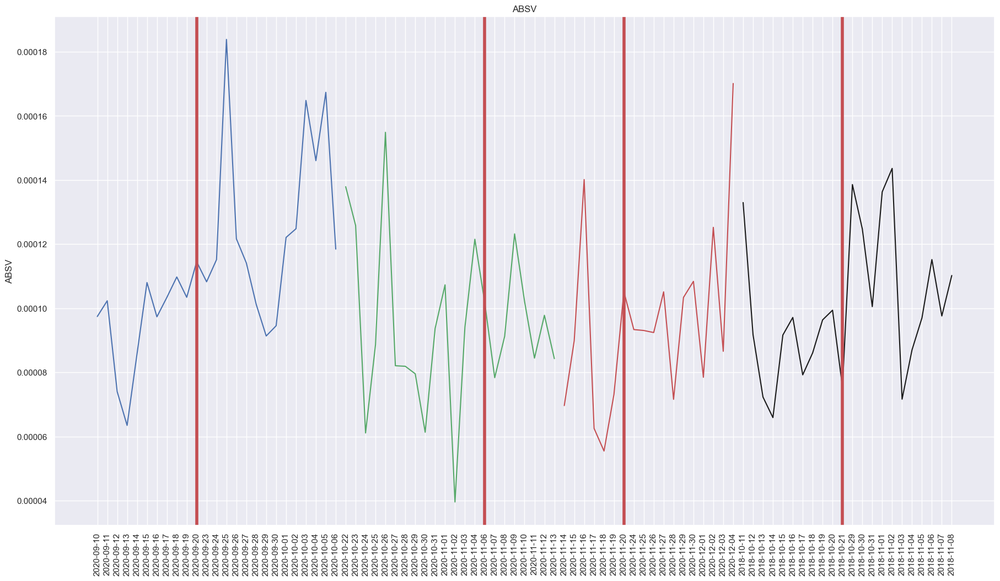

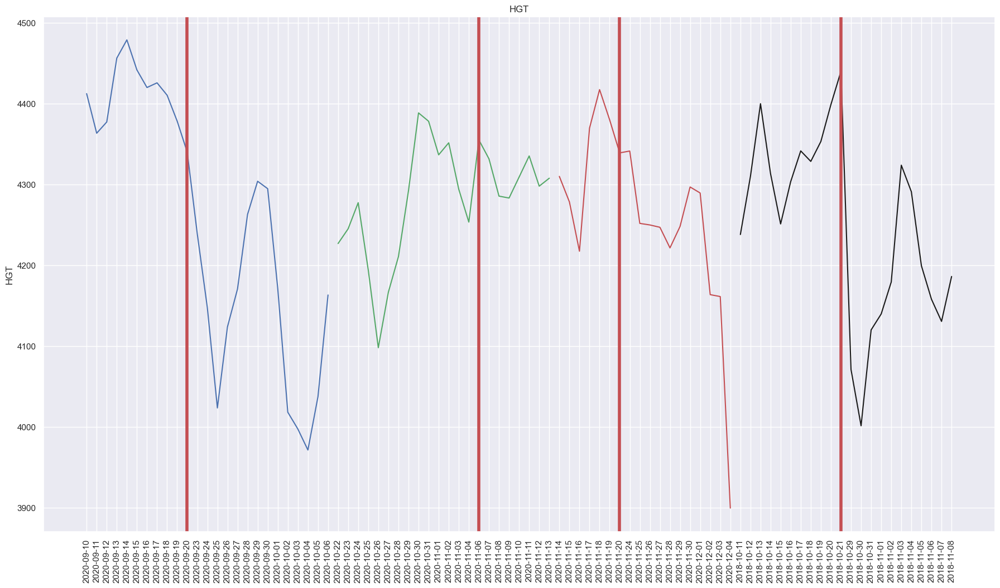

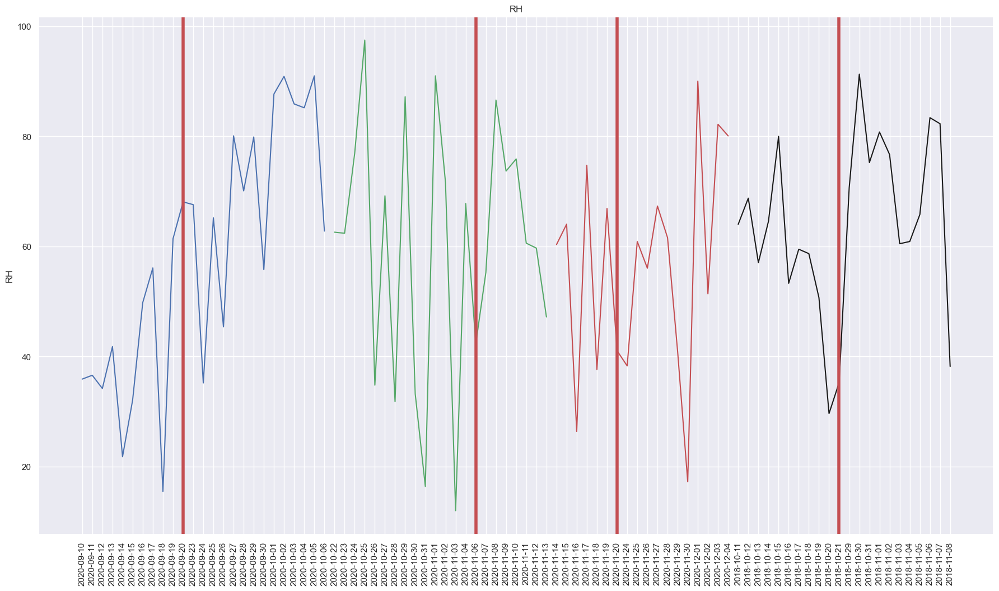

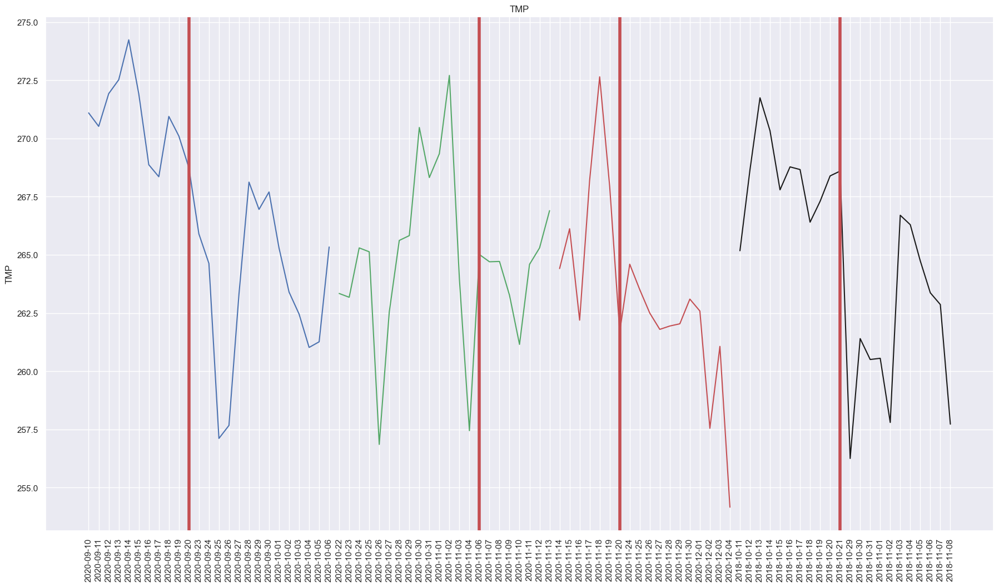

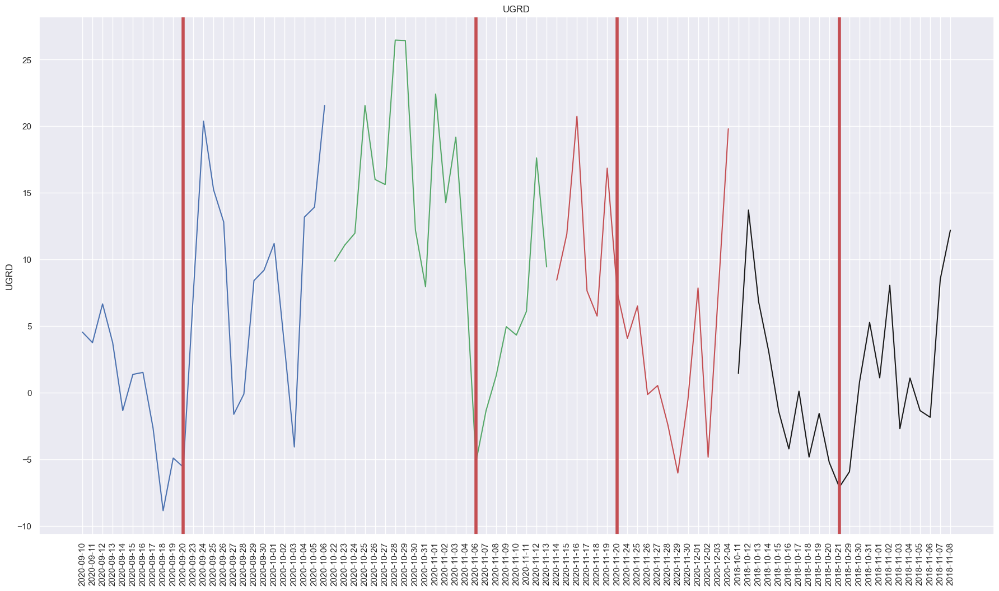

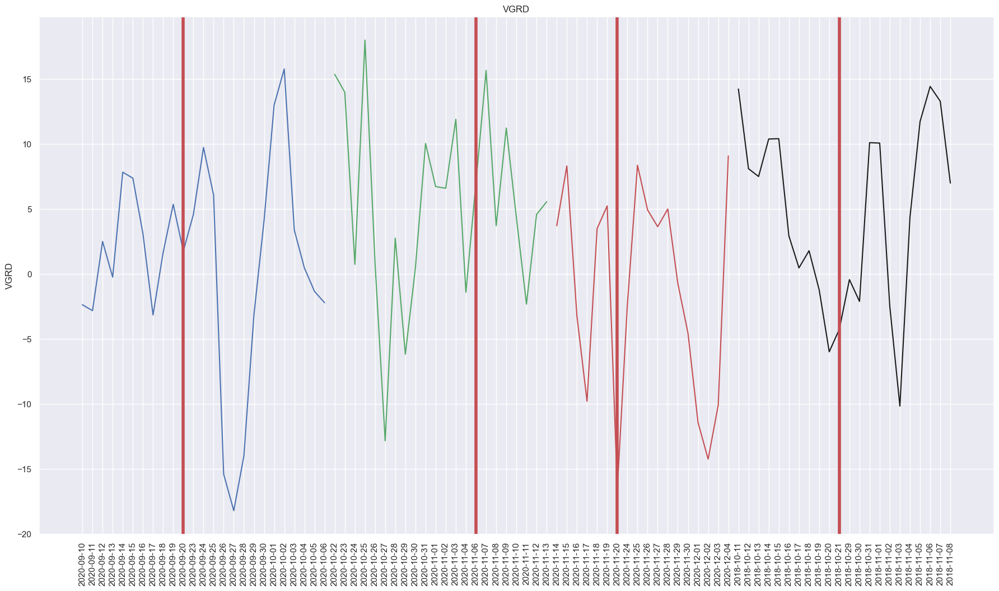

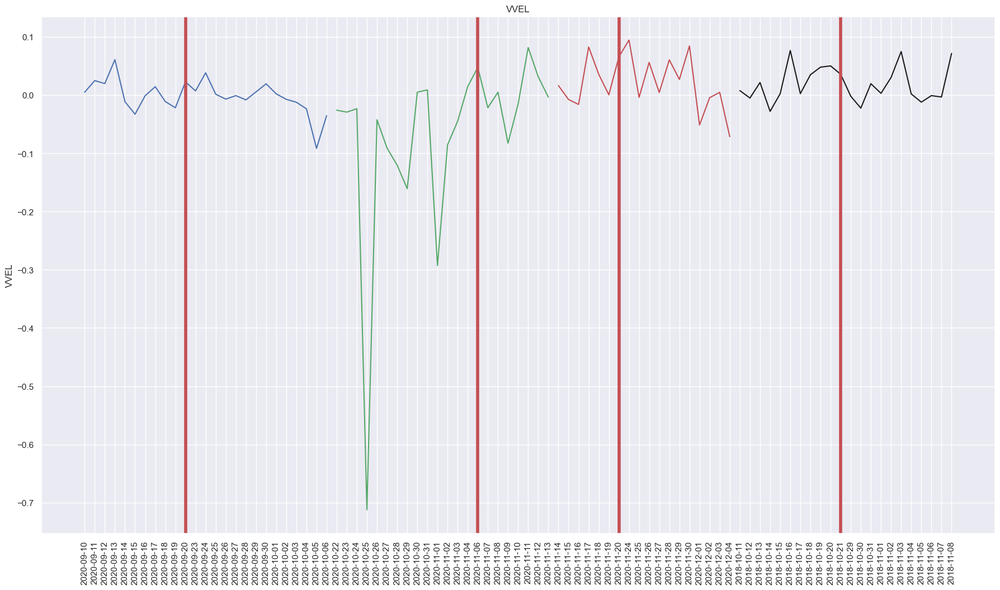

In [305]:
for var in ["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"]:
    fig, ax = plt.subplots(figsize=(22, 12))
    for i in colors.keys():
        ax.plot(df_propa_avg.loc[df_propa_avg["episode"] == i, "date"], df_propa_avg.loc[df_propa_avg["episode"] == i, var], color=colors[i])
        plt.axvline(x = list(df_propa_avg.loc[df_propa_avg.date == list(episodes_limits.loc[episodes_limits.episode == i].debut)[0]].date)[0], color = 'r', label = 'axvline - full height', linewidth=4)
        #plt.axvline(x = list(df_propa_avg.loc[df_propa_avg.date == episodes_limits.loc[episodes_limits.episode == i].fin[0]].date)[0], color = 'r', label = 'axvline - full height')
        ax.set_title(var)
        ax.set_ylabel(var)
    plt.xticks(rotation = 90)
    plt.show()

In [308]:
df_propa_avg

,ABSV,HGT,RH,TMP,UGRD,VGRD,VVEL,date,episode
0,0.000133,4238.000,64.02325,265.178,1.444570,14.219800,0.007874,2018-10-11,8
2940,0.000092,4309.890,68.77810,268.652,13.705200,8.091095,-0.004934,2018-10-12,8
5880,0.000072,4399.850,57.05190,271.748,6.835875,7.491005,0.021802,2018-10-13,8
8820,0.000066,4313.240,64.58140,270.333,3.102670,10.374200,-0.027817,2018-10-14,8
11760,0.000092,4251.060,80.00000,267.795,-1.418365,10.401250,0.002631,2018-10-15,8
...,...,...,...,...,...,...,...,...,...
105819,0.000108,4296.815,17.25000,263.100,-0.519484,-4.535990,0.084641,2020-11-30,7
106575,0.000078,4289.385,90.05000,262.589,7.851855,-11.428550,-0.051184,2020-12-01,7
107331,0.000125,4163.570,51.40000,257.550,-4.837360,-14.247000,-0.004369,2020-12-02,7
108087,0.000087,4161.215,82.20000,261.069,7.446325,-10.102300,0.004915,2020-12-03,7


In [326]:
df_propa_avg.to_csv("df_propa_avg.csv")

In [315]:
import numpy as np

In [316]:
np.array(df_propa_avg.loc[df_propa_avg.episode == 8, "ABSV"])

array([1.329470e-04, 9.170590e-05, 7.228975e-05, 6.587650e-05,
       9.162680e-05, 9.711090e-05, 7.920860e-05, 8.607450e-05,
       9.634820e-05, 9.937130e-05, 7.542755e-05, 1.385590e-04,
       1.246905e-04, 1.004860e-04, 1.362820e-04, 1.435995e-04,
       7.162825e-05, 8.700000e-05, 9.696810e-05, 1.151720e-04,
       9.757380e-05, 1.101990e-04])

In [306]:
import PELT

E:\PROPEX\PELT.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({


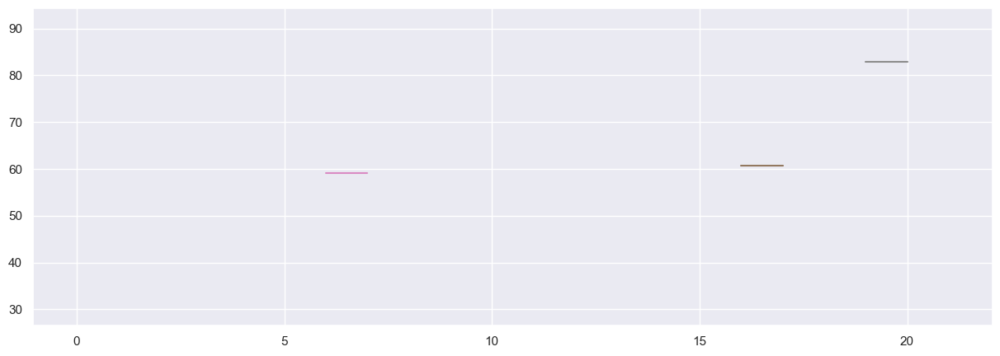

In [324]:
var = "RH"
CP = PELT.pelt(np.array(df_propa_avg.loc[df_propa_avg.episode == 8, var]))
segments = PELT.backtracking(CP)
PELT.plot_segments(np.array(df_propa_avg.loc[df_propa_avg.episode == 8, var]), segments)

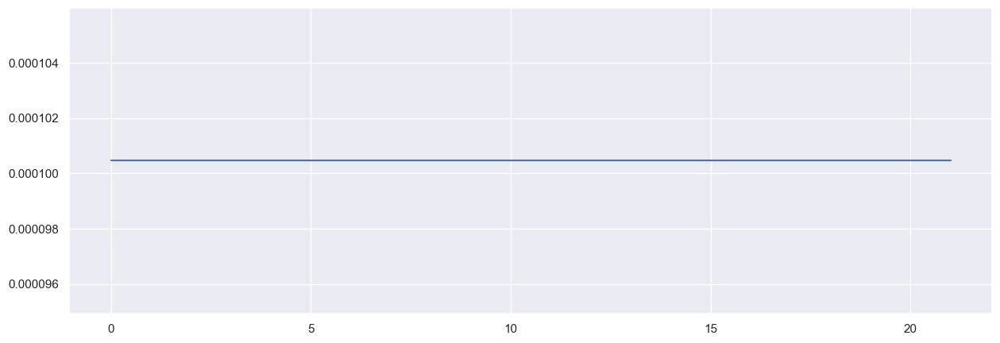

In [ ]:
whole_df_gpd_ = whole_df_gpd

In [ ]:
len(res)

In [ ]:
whole_df_gpd_.is_proba = res

C:\Users\TIGHIDET\AppData\Local\Temp\ipykernel_8772\3715298463.py:1: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  cascaded_union(episodes_poly[episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])].geometry)


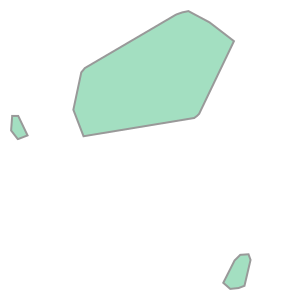

In [134]:
cascaded_union(episodes_poly[episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])].geometry)

In [135]:
whole_df_gpd.iloc[0].geometry.within(cascaded_union(episodes_poly[episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])].geometry))

C:\Users\TIGHIDET\AppData\Local\Temp\ipykernel_8772\2793045685.py:1: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  whole_df_gpd.iloc[0].geometry.within(cascaded_union(episodes_poly[episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])].geometry))


False

In [101]:
type(whole_df_gpd["geometry"])

geopandas.geoseries.GeoSeries

In [86]:
whole_df_gpd.iloc[0].geometry.within(episodes_poly[episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])])

AttributeError: 'Series' object has no attribute 'within'

In [83]:
int(whole_df_gpd.iloc[0]["episode"][-1])

5

In [82]:
episodes_poly.episode == int(whole_df_gpd.iloc[0]["episode"][-1])

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7      True
8      True
9      True
10    False
11    False
12    False
Name: episode, dtype: bool

# Time series segmentation:

In [54]:
os.getcwd()

'E:\\PROPEX'

In [207]:
from sklearn import hmm

ImportError: cannot import name 'hmm' from 'sklearn' (E:\anaconda\envs\geo_env\lib\site-packages\sklearn\__init__.py)

In [210]:
whole_df.to_csv("whole_df.csv")

# Visualisation de la ST en fonction de chaque variable :

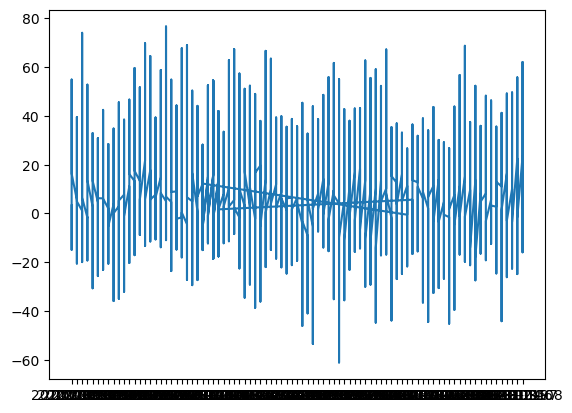

In [178]:
plt.plot(whole_df["forecast.date"], whole_df["UGRD"])

### Etude du 5éme épisode :

In [179]:
df_ep5 = whole_df[whole_df.episode == "EP5"]

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [45]:
!pip install searborn

^C


In [46]:
import seaborn as sns

ModuleNotFoundError: No module named 'seaborn'

ERROR: Could not find a version that satisfies the requirement searborn (from versions: none)
ERROR: No matching distribution found for searborn


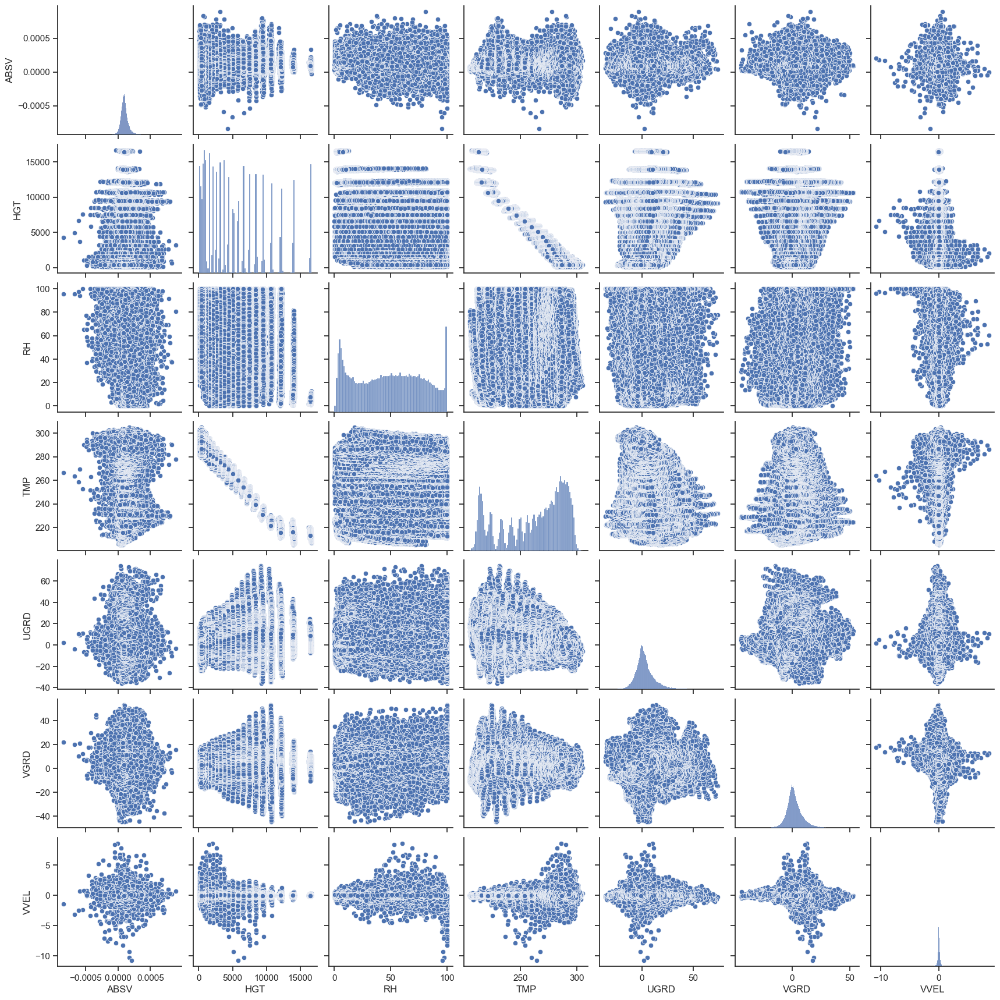

In [ ]:
sns.set(style="ticks", color_codes=True)

g = sns.pairplot(df_ep5[["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])
plt.show()

In [23]:
import numpy as np

C:\Users\tighidet\AppData\Local\Temp\2\ipykernel_2544\4245902186.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df_ep5.corr()


<AxesSubplot: xlabel='variables', ylabel='variables'>

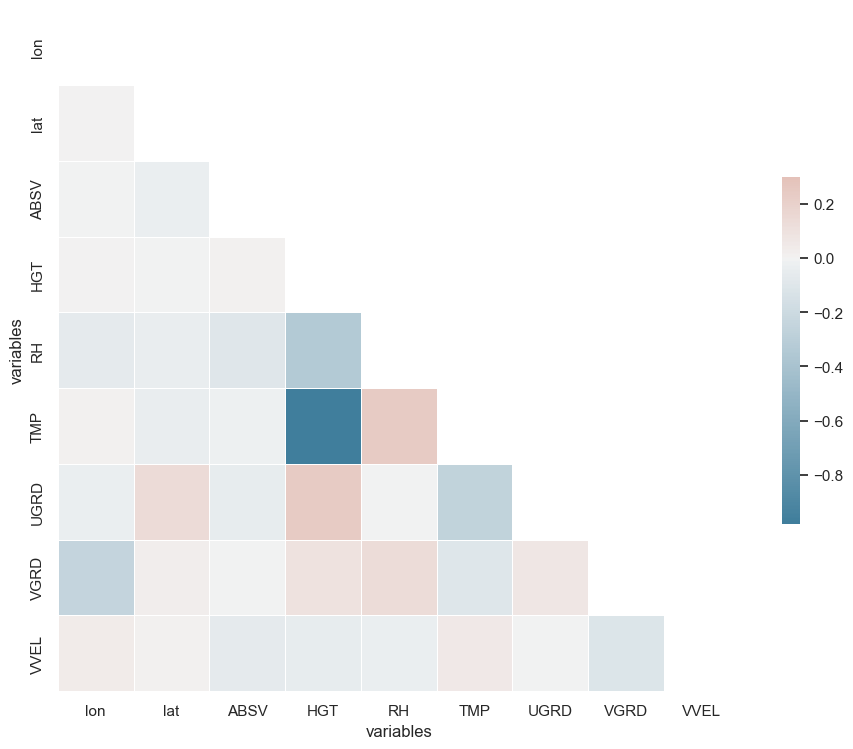

In [ ]:
sns.set_theme(style="white")
corr = df_ep5.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


c:\Users\tighidet\.conda\envs\geo_env\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: xlabel='variables'>

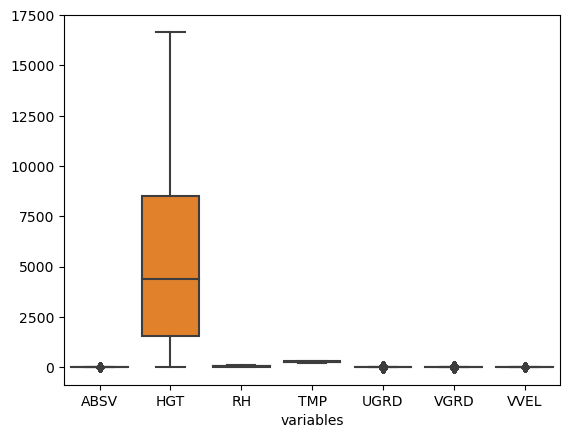

In [19]:
sns.boxplot(df_ep5[["ABSV", "HGT", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

c:\Users\tighidet\.conda\envs\geo_env\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: xlabel='variables'>

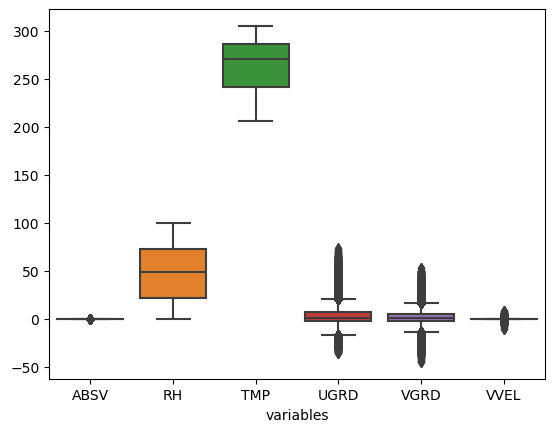

In [20]:
sns.boxplot(df_ep5[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

In [24]:
df_ep5_centered = df_ep5
for x in ["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]:
    df_ep5_centered[x] = df_ep5_centered[x] - np.mean(df_ep5_centered[x])

C:\Users\tighidet\AppData\Local\Temp\2\ipykernel_4180\1689227789.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ep5_centered[x] = df_ep5_centered[x] - np.mean(df_ep5_centered[x])


c:\Users\tighidet\.conda\envs\geo_env\lib\site-packages\seaborn\categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


<AxesSubplot: xlabel='variables'>

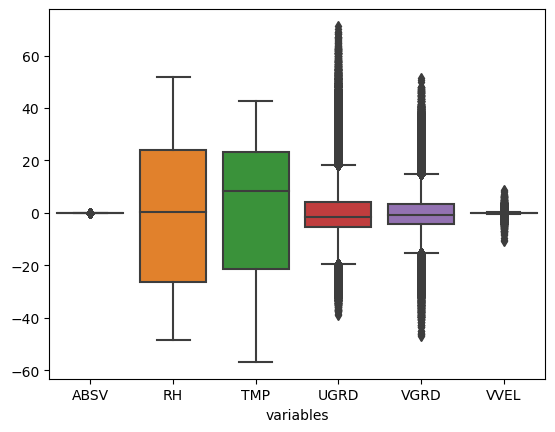

In [25]:
sns.boxplot(df_ep5[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

## Réduction de la dimension :

In [20]:
df_ep5.shape

(449064, 12)

In [21]:
from sklearn.pipeline import Pipeline
import numpy as np

In [180]:
pipeline = Pipeline([("scaling", StandardScaler()), ("pca", PCA(n_components=2))])
res = pipeline.fit_transform(df_ep5[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

In [181]:
res.shape

(1020600, 2)

(array([-6., -4., -2.,  0.,  2.,  4.,  6.,  8.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

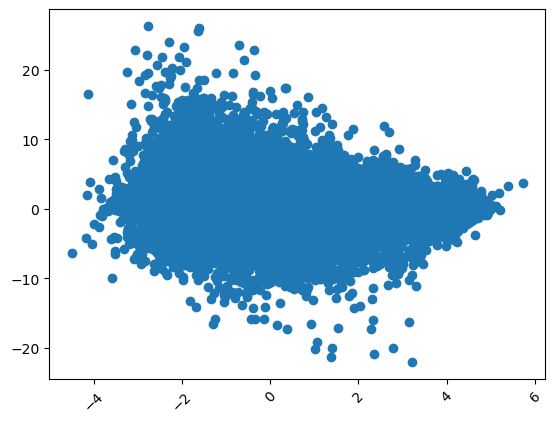

In [182]:
plt.scatter(res[:,0], res[:,1])
plt.xticks(rotation = 45)

In [184]:
pipeline = Pipeline([("scaling", StandardScaler()), ("pca", PCA(n_components=3))])
res_whole = pipeline.fit_transform(whole_df[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

In [185]:
res_whole.shape

(3714984, 3)

In [186]:
np.unique(whole_df.episode)

array(['EP5', 'EP6', 'EP7', 'EP8'], dtype=object)

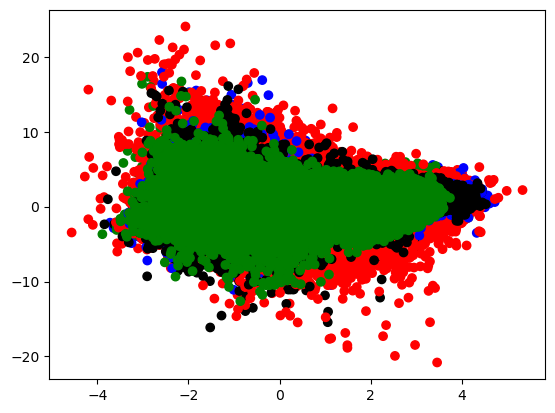

In [187]:
color_dict = { 'EP5':'red', 'EP6':'blue', 'EP7':'black', 'EP8':'green'}

plt.scatter(res_whole[:,0], res_whole[:,1], color=[ color_dict[i] for i in whole_df['episode'] ] )

In [1]:
%matplotlib inline

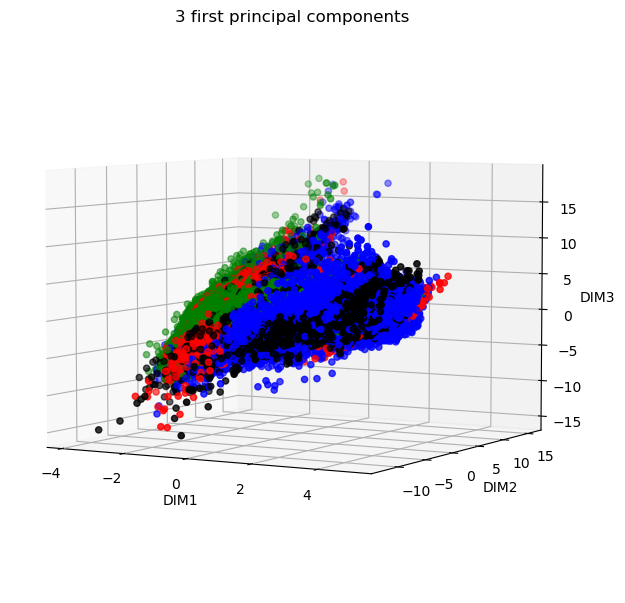

In [45]:
color_dict = { 'EP5':'red', 'EP6':'blue', 'EP7':'black', 'EP8':'green'}

fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter3D(res_whole[:,0], res_whole[:,1], res_whole[:,2], color=[ color_dict[i] for i in whole_df.loc[:, 'episode'] ])
ax.set_xlabel('DIM1')
ax.set_ylabel('DIM2')
ax.set_zlabel('DIM3')
ax.set_title("3 first principal components")
ax.view_init(elev=5, azim=300)

In [92]:
dates = pd.read_csv("LISTES_EPISODES/LISTE1/dates.csv")
dates

,NUMERO,DEBUT,FIN
0,1,2020-01-19,2020-01-23
1,2,2020-05-16,2020-05-18
2,3,2020-07-17,2020-07-20
3,4,2020-08-04,2020-08-07
4,5,2020-09-21,2020-09-22
5,6,2020-11-05,2020-11-05
6,7,2020-11-21,2020-11-23
7,8,2018-10-22,2018-10-28


In [91]:
np.unique(whole_df.episode)

array(['EP5', 'EP6', 'EP7', 'EP8'], dtype=object)

In [95]:
np.unique(whole_df.loc[whole_df["episode"] == "EP8", "forecast.date"])

array(['2018-10-11', '2018-10-12', '2018-10-13', '2018-10-14',
       '2018-10-15', '2018-10-16', '2018-10-17', '2018-10-18',
       '2018-10-19', '2018-10-20', '2018-10-21'], dtype=object)

In [88]:
"2020-08-04" in whole_df["forecast.date"]

False

In [96]:
dates_debut = ["2018-10-21", "2020-11-20", "2020-11-04", "2020-09-20"]

In [97]:
labels = [1 if whole_df.iloc[i]["forecast.date"] in dates_debut else 0 for i in range(whole_df.shape[0])]

In [98]:
np.unique(labels)

array([0, 1])

(array([-6., -4., -2.,  0.,  2.,  4.,  6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

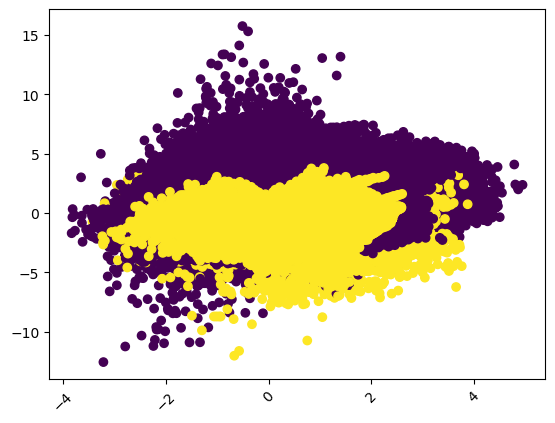

In [99]:
plt.scatter(res_whole[:,0], res_whole[:,1], c=labels)
plt.xticks(rotation = 45)

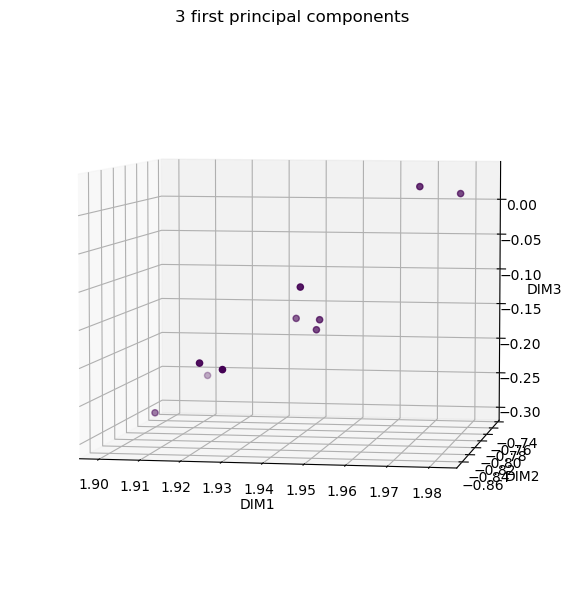

In [112]:
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter3D(res_whole[0:10,0], res_whole[0:10,1], res_whole[0:10,2], c=labels[0:10])
ax.set_xlabel('DIM1')
ax.set_ylabel('DIM2')
ax.set_zlabel('DIM3')
ax.set_title("3 first principal components")
ax.view_init(elev=5, azim=280)

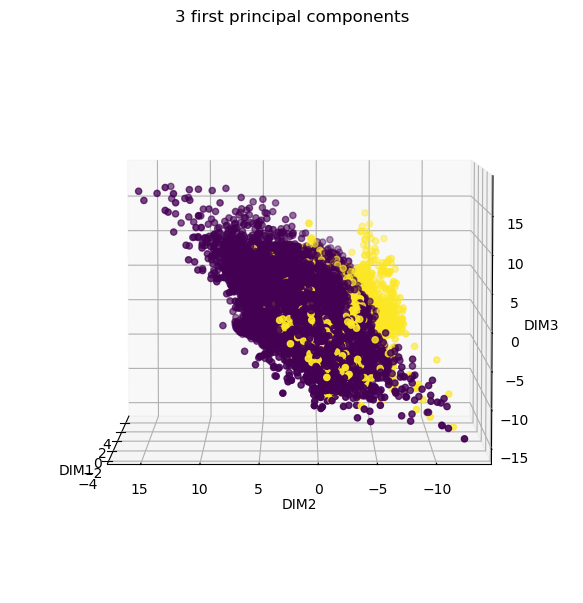

In [106]:
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter3D(res_whole[:,0], res_whole[:,1], res_whole[:,2], c=labels)
ax.set_xlabel('DIM1')
ax.set_ylabel('DIM2')
ax.set_zlabel('DIM3')
ax.set_title("3 first principal components")
ax.view_init(elev=5, azim=180)

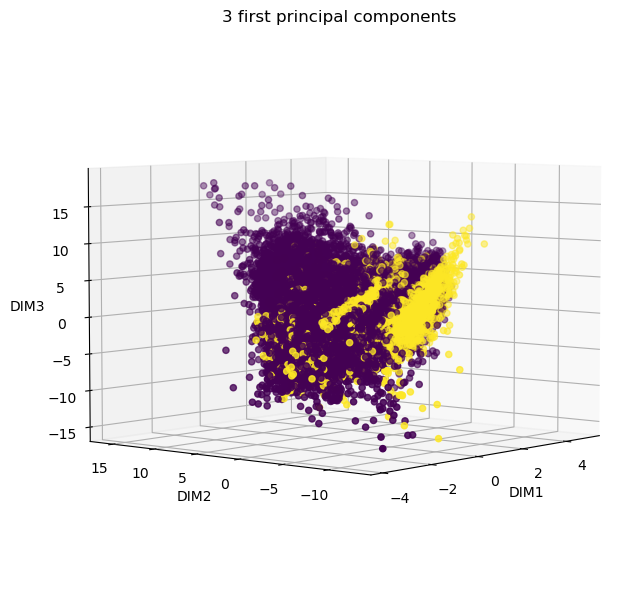

In [111]:
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter3D(res_whole[:,0], res_whole[:,1], res_whole[:,2], c=labels)
ax.set_xlabel('DIM1')
ax.set_ylabel('DIM2')
ax.set_zlabel('DIM3')
ax.set_title("3 first principal components")
ax.view_init(elev=5, azim=220)

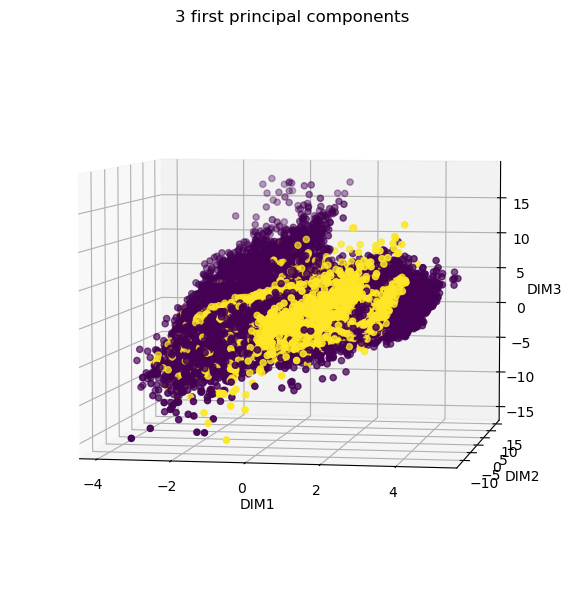

In [113]:
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter3D(res_whole[:,0], res_whole[:,1], res_whole[:,2], c=labels)
ax.set_xlabel('DIM1')
ax.set_ylabel('DIM2')
ax.set_zlabel('DIM3')
ax.set_title("3 first principal components")
ax.view_init(elev=5, azim=280)

## unsupervised approach:

In [107]:
from sklearn.cluster import KMeans

In [188]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(res_whole)

In [189]:
kmeans.labels_

array([1, 1, 1, ..., 0, 0, 0])

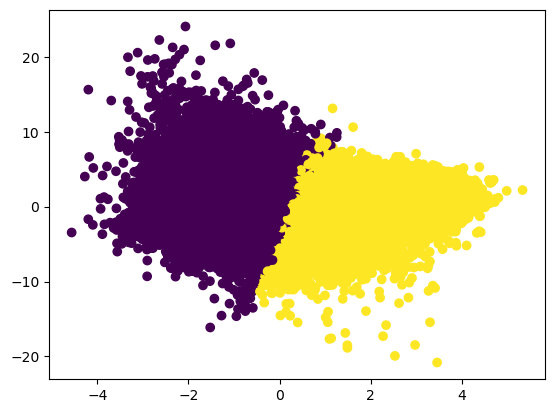

In [191]:
plt.scatter(res_whole[:,0], res_whole[:,1], c=kmeans.labels_)

In [192]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(res_whole)

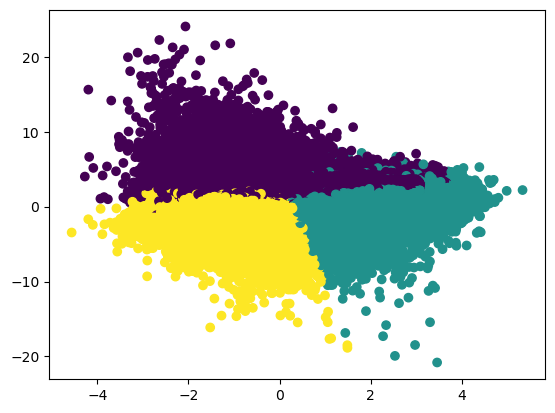

In [193]:
plt.scatter(res_whole[:,0], res_whole[:,1], c=kmeans.labels_)

Text(0.5, 1.0, 'KMeans labels')

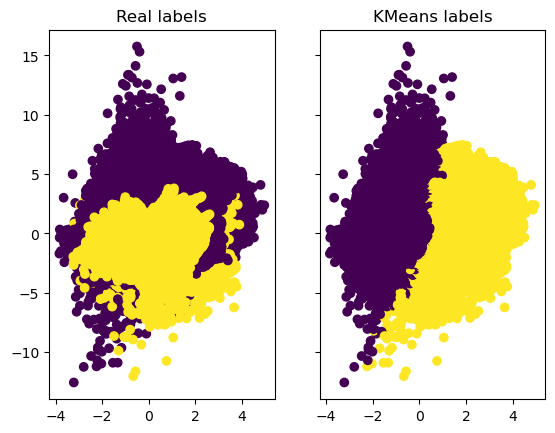

In [115]:
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.scatter(res_whole[:,0], res_whole[:,1], c=labels)
ax1.set_title("Real labels")

ax2.scatter(res_whole[:,0], res_whole[:,1], c=kmeans.labels_)
ax2.set_title("KMeans labels")

In [116]:
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import adjusted_rand_score

In [117]:
normalized_mutual_info_score(labels, kmeans.labels_)

8.206770824232647e-05

In [118]:
adjusted_rand_score(labels, kmeans.labels_)

0.001743180082447119

## On the real data:

In [194]:
kmeans_realdata = KMeans(n_clusters=2, random_state=0).fit(whole_df[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

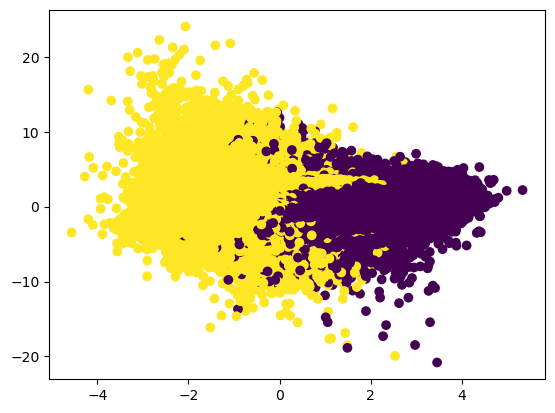

In [195]:
plt.scatter(res_whole[:,0], res_whole[:,1], c=kmeans_realdata.labels_)

In [143]:
normalized_mutual_info_score(labels, kmeans_realdata.labels_)

0.0016305874115536676

In [144]:
adjusted_rand_score(labels, kmeans_realdata.labels_)

0.006425571531192727

In [196]:
kmeans_realdata = KMeans(n_clusters=3, random_state=0).fit(whole_df[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]])

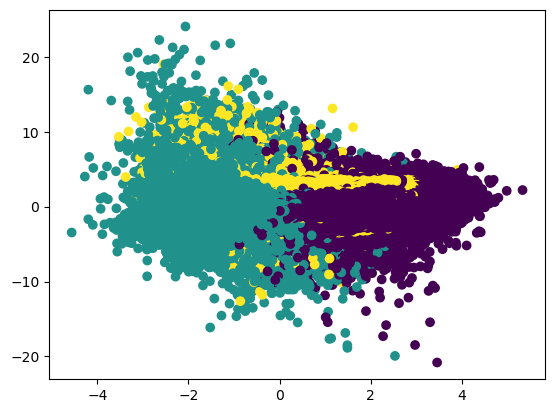

In [197]:
plt.scatter(res_whole[:,0], res_whole[:,1], c=kmeans_realdata.labels_)

## Supervized approach:

In [131]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

In [149]:
# split into train and test
x_train, x_test, y_train, y_test = train_test_split(whole_df[["ABSV", "RH", "TMP", "UGRD", "VGRD", "VVEL"]], labels, test_size=0.2)

In [150]:
lr_realdata = LogisticRegression(random_state=0).fit(x_train, y_train)

In [134]:
lr_labels_train = lr_realdata.predict(x_train)

In [136]:
print(classification_report(y_train, lr_labels_train))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96   1404515
           1       0.64      0.01      0.02    130467

    accuracy                           0.92   1534982
   macro avg       0.78      0.50      0.49   1534982
weighted avg       0.89      0.92      0.88   1534982



In [151]:
lr_labels_test = lr_realdata.predict(x_test)

In [152]:
print(classification_report(y_test, lr_labels_test))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96    351169
           1       0.65      0.01      0.02     32577

    accuracy                           0.92    383746
   macro avg       0.78      0.50      0.49    383746
weighted avg       0.89      0.92      0.88    383746



### using the HGT variable rather than TMP: